<a 
href="https://colab.research.google.com/github/wingated/cs474_labs_f2019/blob/master/DL_Lab8.ipynb"
  target="_parent">
  <img
    src="https://colab.research.google.com/assets/colab-badge.svg"
    alt="Open In Colab"/>
</a>

# Lab 8: GANs

### Description
In this lab, we will build our very first GAN. This can be frustrating at first, but the end result is really cool. We've tried to make the steps intuitive.

Here is what you will learn:
* GANs are generative models that learn to generate data, based on a min-max/adversarial game between a Generator (G) and Discriminator (D).
* The parameters of both Generator and Discriminator are optimized with Stochastic Gradient Descent (SGD) or RMSprop or Adam
* How these concepts translate into pytorch code for GAN optimization.

Overview of the tutorial:
1. GAN intro
2. Defining the neural networks in pytorch, computing a forward pass
3. Training our GAN

This lab is modified from https://github.com/tomsercu/gan-tutorial-pytorch

### Deliverable
We have provided the GAN architecture for you. Your objective is to:
1. Create a DataLoader for the CelebA dataset.
2. Create a Dataset and a DataLoader for a dataset from a domain of your choice.
3. Implement the original GAN loss
4. Implement the training loop and train your GAN.

### Grading Standards
- 25% correctly implement the original GAN loss
- 25% correctly implement the training loop 
- 25% Train on CelebA and display results
- 25% Train on your own dataset and display results

(you will not be graded on quality of generated images)


### Tips:
- This lab is complex. Please read through the entire spec before diving in.
- Also, note that training on this dataset will likely take some time. Please make sure you start early enough to run the training long enough!
- Expected values: Discriminator Loss will hover around ~ 0.5, Generator Loss should hover around ~ 5.5. You should see discernible results within 1 epoch (~20-30 minutes of training on Colab).

# Some cool demos:
* Progress over the last 5 years, from [Ian Goodfellow tweet](https://twitter.com/goodfellow_ian/status/1084973596236144640)

![tweet image](https://github.com/tomsercu/gan-tutorial-pytorch/blob/master/figs/goodfellow_tweet.jpg?raw=1)

* CycleGAN translating horses into zebras: https://www.youtube.com/watch?v=9reHvktowLY
* CycleGAN teaser: ![cyclegan teaser image](https://github.com/tomsercu/gan-tutorial-pytorch/blob/master/figs/cyclegan_teaser_high_res.jpg?raw=1)
* High resolution faces with StyleGAN https://www.youtube.com/watch?v=kSLJriaOumA
* https://ganbreeder.app web-interface to create images based on [BigGan](https://arxiv.org/abs/1809.11096)


# 1. GAN first introduction
[GAN picture](figs/gan_xavigiro.png)

<img src="https://github.com/tomsercu/gan-tutorial-pytorch/blob/master/figs/gan_xavigiro.png?raw=1" alt="GAN picture" style="width: 700px;"/>

GANs are a class of unsupervised generative models which implicitly model the data density.

The basic setup is pictured above. There are two "competing" neural networks:
* The Generator wants to learn to generate realistic images that are indistinguishable from the real data. 
    - *input*: Gaussian noise random sample. *output*: a (higher dimensional) datapoint
* The Discriminator wants to tell the real & fake images apart.
    - *input*: datapoint/image, *output*: probability assigned to datapoint being real. Think binary classifier.
* The typical analogy: the generator is like a counterfeiter trying to look like real, the discriminator is the police trying to tell counterfeits from the real work.
* The key novelty of GANs is to pass the error signal (gradients) from the discriminator to the generator: the generator neural network uses the information from the competing discriminator neural network to know how to produce more realistic output.

Let's start with defining the generator G and discriminator D in pytorch.

# 2. Define the Generator and Discriminator

In [2]:
import sys
print(sys.version) # python 3.6
import torch
import torch.nn as nn
import torchvision.datasets
import torchvision.transforms as transforms
import torch.nn.functional as F
import torchvision.utils as vutils
print(torch.__version__) 

%matplotlib inline
import matplotlib.pyplot as plt
import os, time

import itertools
import pickle
import imageio
import torch.optim as optim
from torchvision import datasets, transforms
from torch.autograd import Variable
from tqdm.notebook import tqdm
import pdb

# You can use whatever display function you want. This is a really simple one that makes decent visualizations
def show_imgs(x, new_fig=True):
    grid = vutils.make_grid(x.detach().cpu(), nrow=8, normalize=True, pad_value=0.3)
    grid = grid.transpose(0,2).transpose(0,1) # channels as last dimension
    if new_fig:
        plt.figure()
    plt.imshow(grid.numpy())
    plt.show()

3.6.9 (default, Oct  8 2020, 12:12:24) 
[GCC 8.4.0]
1.6.0+cu101


## Defining the neural networks

In [3]:
# helper function to initialize the weights using a normal distribution. 
# this was done in the original work (instead of xavier) and has been shown
# to help GAN performance
def normal_init(m, mean, std):
    if isinstance(m, nn.ConvTranspose2d) or isinstance(m, nn.Conv2d):
        m.weight.data.normal_(mean, std)
        m.bias.data.zero_()

In [4]:
class Generator(nn.Module):
    # initializers
    def __init__(self, d=128):
        super().__init__()
        self.deconv1 = nn.ConvTranspose2d(100, d*8, 4, 1, 0)
        self.deconv1_bn = nn.BatchNorm2d(d*8)
        self.deconv2 = nn.ConvTranspose2d(d*8, d*4, 4, 2, 1)
        self.deconv2_bn = nn.BatchNorm2d(d*4)
        self.deconv3 = nn.ConvTranspose2d(d*4, d*2, 4, 2, 1)
        self.deconv3_bn = nn.BatchNorm2d(d*2)
        self.deconv4 = nn.ConvTranspose2d(d*2, d, 4, 2, 1)
        self.deconv4_bn = nn.BatchNorm2d(d)
        self.deconv5 = nn.ConvTranspose2d(d, 3, 4, 2, 1)

    # weight_init
    def weight_init(self, mean, std):
        for m in self._modules:
            normal_init(self._modules[m], mean, std)

    # forward method
    def forward(self, x):
        x = F.relu(self.deconv1_bn(self.deconv1(x)))
        x = F.relu(self.deconv2_bn(self.deconv2(x)))
        x = F.relu(self.deconv3_bn(self.deconv3(x)))
        x = F.relu(self.deconv4_bn(self.deconv4(x)))
        x = torch.tanh(self.deconv5(x))

        return x

In [5]:
class Discriminator(nn.Module):
    # initializers
    def __init__(self, d=128):
        super().__init__()
        self.conv1 = nn.Conv2d(3, d, 4, 2, 1)
        self.conv2 = nn.Conv2d(d, d*2, 4, 2, 1)
        self.conv2_bn = nn.BatchNorm2d(d*2)
        self.conv3 = nn.Conv2d(d*2, d*4, 4, 2, 1)
        self.conv3_bn = nn.BatchNorm2d(d*4)
        self.conv4 = nn.Conv2d(d*4, d*8, 4, 2, 1)
        self.conv4_bn = nn.BatchNorm2d(d*8)
        self.conv5 = nn.Conv2d(d*8, 1, 4, 1, 0)

    # weight_init
    def weight_init(self, mean, std):
        for m in self._modules:
            normal_init(self._modules[m], mean, std)

    # forward method
    def forward(self, x):
        x = F.leaky_relu(self.conv1(x), 0.2)
        x = F.leaky_relu(self.conv2_bn(self.conv2(x)), 0.2)
        x = F.leaky_relu(self.conv3_bn(self.conv3(x)), 0.2)
        x = F.leaky_relu(self.conv4_bn(self.conv4(x)), 0.2)
        x = torch.sigmoid(self.conv5(x))

        return x

In [ ]:
#####
# instantiate a Generator and Discriminator according to their class definition.
#####
D = Discriminator()
G = Generator()
print(D)
print(G)

## Testing the neural networks (forward pass)

In [ ]:
samples = torch.randn(5, 3, 64, 64) # batch size x channels x width x height
res = D(samples) # shape=5 x 1 x 1 x 1
print(res)

In [ ]:
samples10 = torch.randn(10, 3, 64, 64) # batch size x channels x width x height
res10 = D(samples10) # shape=10 x 1 x 1 x 1
print(res10)

In [ ]:
samples128 = torch.randn(10, 3, 128, 128) # batch size x channels x width x height
res128 = D(samples128) # shape=10 x 1 x 5 x 5
print(res128)

Things to try:
* What happens if you change the number of samples in a batch?
* What happens if you change the width/height of the input?
* What are the weights of the discriminator? You can get an iterator over them with `.parameters()` and `.named_parameters()`

In [ ]:
for name, p in D.named_parameters():
    print(name, p.shape)

We will think of the concatentation of all these discriminator weights in one big vector as $\theta_D$.

Similarly we name the concatentation of all the generator weights in one big vector $\theta_G$.

In [ ]:
for name, p in G.named_parameters():
    print(name, p.shape)

In [ ]:
# A small batch of 2 samples, random noise.
z = torch.randn(2, 100).view(-1,100,1,1)
print(z.shape)
G = G.cpu()
x_gen = G(z)
#notice that the generated value is a batch of 2 images
x_gen.shape

torch.Size([2, 100, 1, 1])


torch.Size([2, 3, 64, 64])

torch.Size([8, 100, 1, 1])


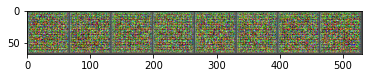

In [ ]:
z = torch.randn(8, 100).view(-1,100,1,1).cuda()
print(z.shape)
G = G.cuda()
show_imgs(G(z))

In traditional deep learning, you measure performance by looking at the loss value. In GANs, this does not work well because we are performing a Min-Max and the loss values may not be intuitively lower when the network is doing well. 

So, performance must be measured qualitatively, by looking at images. Therefore, you can sample random $z$ vectors every pass through the network to see how "novel" the generation is becoming. And you can also sample a single $z$ vector that is passed through the network every time to see how a single example progresses during training. 

In [6]:
fixed_z_ = torch.randn((5 * 5, 100)).view(-1, 100, 1, 1)    # fixed noise
fixed_z_ = Variable(fixed_z_.cuda(), requires_grad=False)

## Loading the data and computing forward pass

In [7]:
# if the celeba.zip file does not exist, download it to the current directory
![ ! -f celeba.zip ] && wget https://s3-us-west-1.amazonaws.com/udacity-dlnfd/datasets/celeba.zip
# if the celeba directory does not exist, unzip the celeba.zip file
![ ! -d celeba ] && echo "unzipping celeba.zip" && unzip -q celeba.zip -d celeba

--2020-11-03 02:13:13--  https://s3-us-west-1.amazonaws.com/udacity-dlnfd/datasets/celeba.zip
Resolving s3-us-west-1.amazonaws.com (s3-us-west-1.amazonaws.com)... 52.219.116.232
Connecting to s3-us-west-1.amazonaws.com (s3-us-west-1.amazonaws.com)|52.219.116.232|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1443490838 (1.3G) [application/zip]
Saving to: ‘celeba.zip’

celeba.zip          100%[===================>]   1.34G  61.3MB/s    in 23s     

2020-11-03 02:13:36 (60.5 MB/s) - ‘celeba.zip’ saved [1443490838/1443490838]

unzipping celeba.zip


In [12]:
batch_size = 128
img_size = 64

In [13]:
#download the data, and change the filepath

filepath = "celeba"
# possible sources for celeba: this AWS link: https://s3-us-west-1.amazonaws.com/udacity-dlnfd/datasets/celeba.zip
dataset = datasets.ImageFolder(root=filepath,
                           transform=transforms.Compose([
                               transforms.Resize(img_size),
                               transforms.CenterCrop(img_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
##### Create the dataloader #####
celeba_train_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

Dataset and DataLoader are abstractions to help us iterate over the data in random order.

Let's look at a sample:

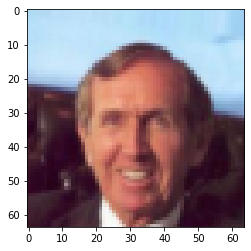

In [9]:
ix=20
x, _ = dataset[ix]
show_imgs(x)

Feed the image into the discriminator; the output will be the probability the (untrained) discriminator assigns to this sample being real.

In [ ]:
# for one image:
Dscore = D(x.unsqueeze(0))
Dscore

tensor([[[[0.6718]]]], grad_fn=<SigmoidBackward>)

In [ ]:
# How you can get a batch of images from the dataloader:
xbatch, _ = iter(celeba_train_loader).next()
print(xbatch.shape)
D(xbatch)
D(xbatch).shape

torch.Size([128, 3, 64, 64])


torch.Size([128, 1, 1, 1])

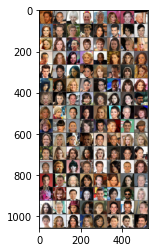

In [ ]:
show_imgs(xbatch)

# 3. Now to train your GAN

We introduced and defined the generator G, the discriminator D, and the dataloader which will give us minibatches of real data. 

To recap the basic idea of the min-max / adversarial game:
* The Generator and Discriminator have competing objectives, they are "adversaries".
* The Discriminator wants to assign high probability to real images and low probability to generated (fake) images
* The Generator wants its generated images to look real, so wants to modify its outputs to get high scores from the Discriminator
* We will optimize both alternatingly, with SGD steps (as before): optimize $\theta_D$ the weights of $D(x, \theta_D)$, and  $\theta_G$ the weights of $G(z, \theta_G)$.
* Final goal of the whole min-max game is for the Generator to match the data distribution: $p_G(x) \approx p_{data}(x)$.


Now what are the objective functions for each of them? As mentioned in the introduction, the objective for the discriminator is to classify the real images as real, so $D(x) = 1$, and the fake images as fake, so $D(G(z))=0$.
This is a typical binary classification problem which calls for the binary cross-entropy (BCE) loss, which encourages exactly this solution.

For G we just try to minimize the same loss that D maximizes. See how G appears inside D? This shows how the output of the generator G is passed into the Discriminator to compute the loss.


This is the optimization problem:

$$
\min _{G} \max _{D} V(D, G)=\mathbb{E}_{\boldsymbol{x} \sim p_{\text { data }}(\boldsymbol{x})}[\log D(\boldsymbol{x})]+\mathbb{E}_{\boldsymbol{z} \sim p_{\boldsymbol{z}}(\boldsymbol{z})}[\log (1-D(G(\boldsymbol{z})))]
$$

We will do a single SGD step alternatingly to maximize D, then minimize G.
In fact for G we use a modified (non-saturing) loss $-\log D(G(z))$. Different modifications of the loss and the relation to the distance between distributions $p_{data}$ and $p_{G}$ became a topic of research over the last years.

BCE takes care of the log, you won't manually compute any Log values


In [8]:

def train(D, G, D_optimizer, G_optimizer, loss_func, train_loader, num_epochs, num_iter_train_gen=5):
    device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
    num_iter = 0
    
    for epoch in range(num_epochs):
        D_losses = []
        G_losses = []
        epoch_start_time = time.time()
        for x_, _ in tqdm(train_loader):
            # 1. Optimize the discriminator            
            #####
            # create y_real_ and y_fake_ tensors you will use in your BCE loss to push probabilities 
            # in the proper direction
            # y_real_ will be a tensor of all ones, because you want whatever is output by the generator
            # to be more likely to be real and you want the discriminator to recognize real images
            # y_fake_ then is a tensor of all zeros, because you want the discriminator to recognize fake images
            #####
            batch_size = x_.shape[0]
            y_real_ = torch.ones(batch_size)
            y_fake_ = torch.zeros(batch_size)
            x_, y_real_, y_fake_ = Variable(x_.to(device)), Variable(y_real_.to(device)), Variable(y_fake_.to(device))

            # Reset discriminator gradients
            D_optimizer.zero_grad()

            #####
            # pass x_ through the discriminator to get D_result_real_img
            # you will need to squeeze() the output before passing it to BCE_loss
            # compute D_real_loss using BCE_loss and y_real_
            # you are trying to make the discriminator recognize the real image properly
            #####
            D_result_real_img = D(x_)
            D_loss_real = loss_func(D_result_real_img.squeeze(), y_real_)

            #####
            # sample a z vector (remember to view(-1,100,1,1))
            # pass the z vector to the GPU and through your generator
            # this will create fake_imgs
            #####
            z = torch.randn(batch_size, 100, 1, 1).to(device)
            fake_imgs = G(z).detach()

            #####
            # pass fake_imgs through the discriminator and get D_result_fake_img
            # you will need to squeeze() the output of the discriminator
            # compute D_fake_loss for the generated images by using BCE_loss and y_fake_
            # you are trying to make the discriminator recognize the fake image properly
            # reduce D_fake_loss to the mean value
            #####
            D_result_fake_img = D(fake_imgs)
            D_loss_fake = loss_func(D_result_fake_img.squeeze(), y_fake_)
            # D_loss_fake = torch.mean(D_loss_fake)

            #####
            # sum D_loss_real and D_loss_fake to get total_D_loss
            # compute the gradients
            # step the optimizer
            #####
            total_D_loss = D_loss_real + D_loss_fake
            D_losses.append(total_D_loss.item())
            total_D_loss.backward()
            D_optimizer.step()

            # 2. Optimize the generator

            # Reset generator gradients
            G_optimizer.zero_grad()

            #####
            # sample a z vector (viewed properly) and pass it to the GPU and through the generator
            # compute the discriminated value of the generated image, properly squeezing the output
            # get G_loss by using BCE_loss and the proper y_tensor
            # you are trying to make the generator generate real images
            # compute the gradients
            # step the optimizer
            #####
            z = torch.randn(batch_size, 100, 1 ,1).to(device)
            D_result_fake_img = D(G(z))
            G_loss = loss_func(D_result_fake_img.squeeze(), y_real_)

            G_losses.append(G_loss.item())
            G_loss.backward()
            G_optimizer.step()

            # for i in range(num_iter_train_gen):
            #     z = torch.randn(batch_size, 100, 1 ,1).to(device)
            #     D_result_fake_img = D(G(z))
            #     G_loss = loss_func(D_result_fake_img.squeeze(), y_real_)

            #     G_losses.append(G_loss.item())
            #     G_loss.backward()
            #     G_optimizer.step()

            if num_iter % 100 == 0:
                print('loss_d: %.3f, loss_g: %.3f' % (torch.mean(torch.FloatTensor(D_losses)),
                                                                  torch.mean(torch.FloatTensor(G_losses))))
                show_imgs(fake_imgs.detach().clone()[:4])

            torch.save(D.state_dict(), './discriminator')
            torch.save(G.state_dict(), './generator')

            num_iter += 1

        # generate a fixed_z_ image and save
        x_gen = G(fixed_z_).detach()
        collect_x_gen.append(x_gen.detach().clone())
        epoch_end_time = time.time()
        per_epoch_ptime = epoch_end_time - epoch_start_time

        # print out statistics
        print('[%d/%d] - ptime: %.2f, loss_d: %.3f, loss_g: %.3f' % ((epoch + 1), num_epochs, per_epoch_ptime, torch.mean(torch.FloatTensor(D_losses)),
                                                                  torch.mean(torch.FloatTensor(G_losses))))
        show_imgs(fake_imgs[:4].detach().clone())

loss_d: 2.254, loss_g: 1.345


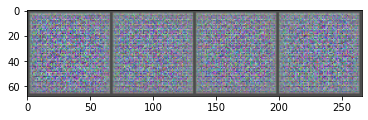

loss_d: 9.168, loss_g: 1.008


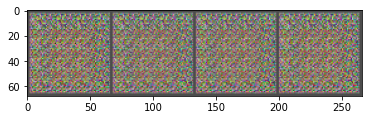

loss_d: 9.005, loss_g: 2.077


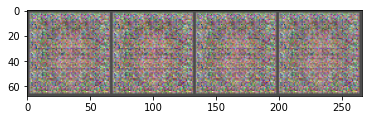

loss_d: 7.752, loss_g: 2.977


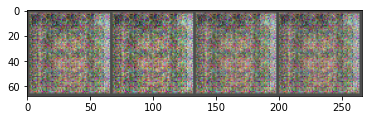

loss_d: 6.814, loss_g: 3.327


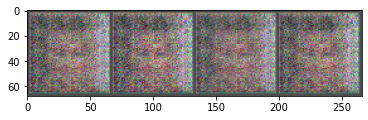

loss_d: 6.090, loss_g: 3.460


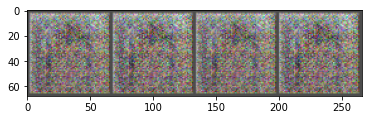

loss_d: 5.326, loss_g: 3.608


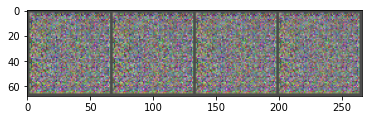

loss_d: 4.711, loss_g: 3.665


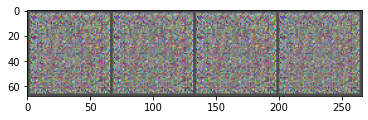

loss_d: 4.221, loss_g: 3.705


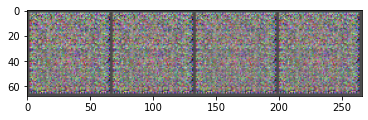

loss_d: 3.812, loss_g: 3.729


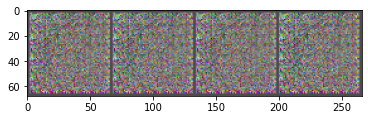

loss_d: 3.472, loss_g: 3.744


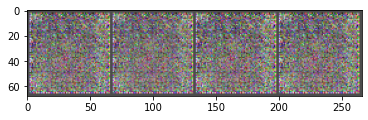

loss_d: 3.189, loss_g: 3.749


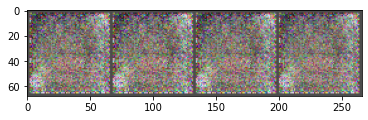

loss_d: 2.994, loss_g: 3.740


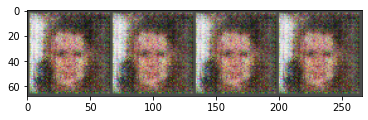

loss_d: 2.851, loss_g: 3.726


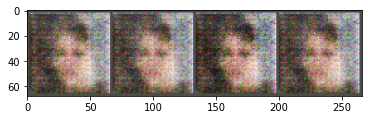

loss_d: 2.694, loss_g: 3.717


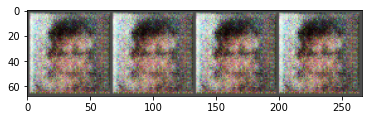

loss_d: 2.545, loss_g: 3.690


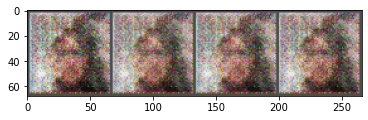


[1/3] - ptime: 3710.85, loss_d: 2.444, loss_g: 3.691


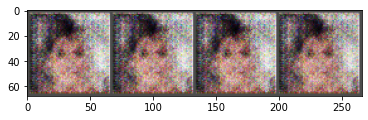

loss_d: 0.479, loss_g: 3.350


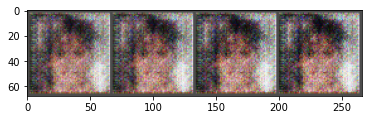

loss_d: 0.334, loss_g: 3.525


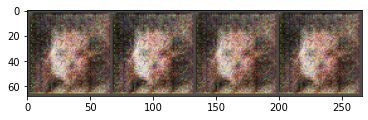

loss_d: 0.248, loss_g: 3.773


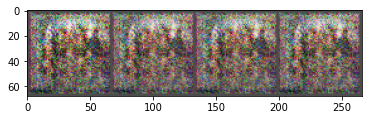

loss_d: 0.238, loss_g: 3.868


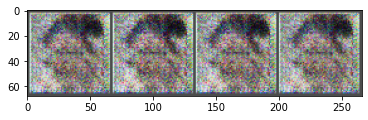

loss_d: 0.239, loss_g: 3.794


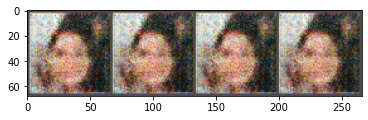

loss_d: 0.215, loss_g: 3.792


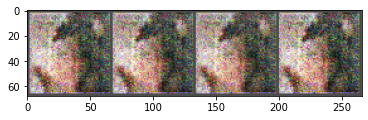

loss_d: 0.199, loss_g: 3.821


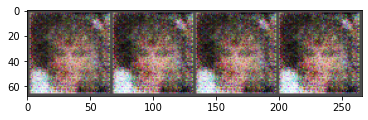

loss_d: 0.201, loss_g: 3.837


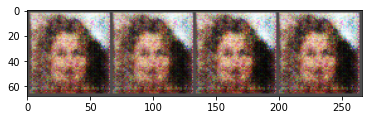

loss_d: 0.202, loss_g: 3.853


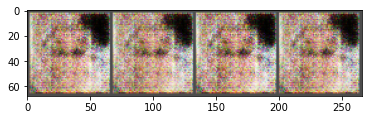

loss_d: 0.200, loss_g: 3.858


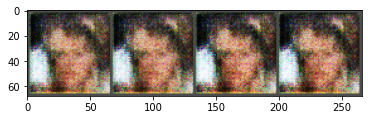

loss_d: 0.187, loss_g: 3.899


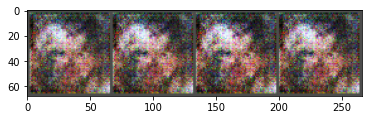

loss_d: 0.179, loss_g: 3.935


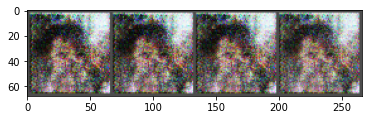

loss_d: 0.241, loss_g: 3.855


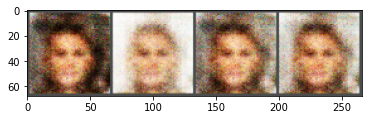

loss_d: 0.326, loss_g: 3.668


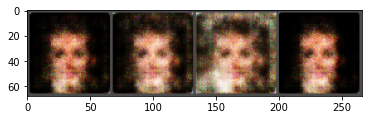

loss_d: 0.387, loss_g: 3.507


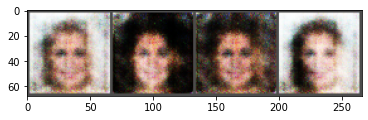

loss_d: 0.433, loss_g: 3.363


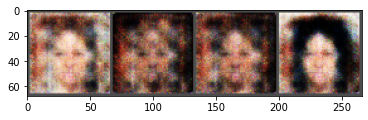


[2/3] - ptime: 3735.97, loss_d: 0.463, loss_g: 3.278


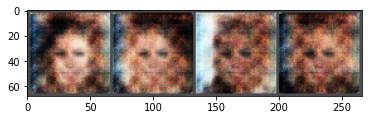

loss_d: 1.160, loss_g: 1.257


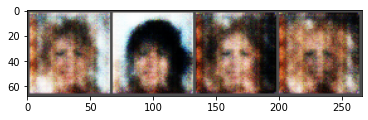

loss_d: 1.164, loss_g: 1.266


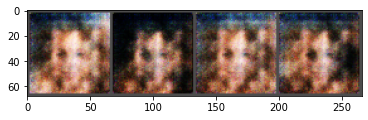

loss_d: 1.141, loss_g: 1.289


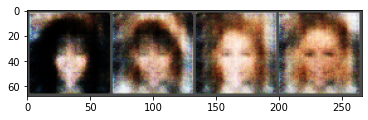

loss_d: 1.153, loss_g: 1.296


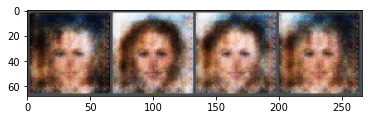

loss_d: 1.164, loss_g: 1.277


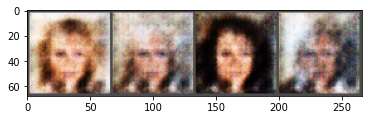

loss_d: 1.167, loss_g: 1.262


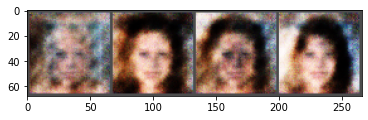

loss_d: 1.187, loss_g: 1.239


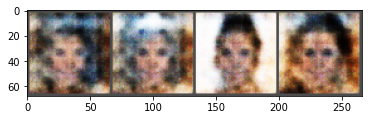

loss_d: 1.210, loss_g: 1.213


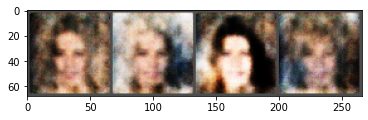

loss_d: 1.221, loss_g: 1.189


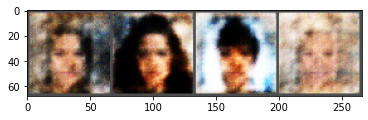

loss_d: 1.231, loss_g: 1.176


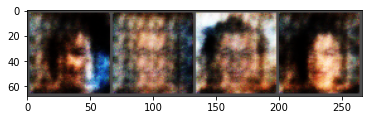

loss_d: 1.240, loss_g: 1.160


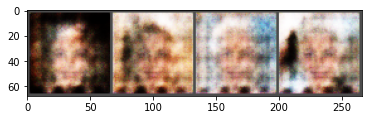

loss_d: 1.246, loss_g: 1.146


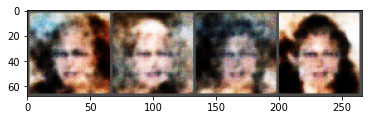

loss_d: 1.251, loss_g: 1.132


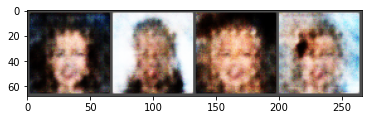

loss_d: 1.259, loss_g: 1.121


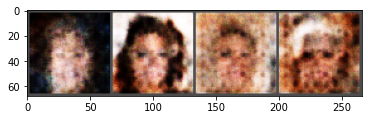

loss_d: 1.265, loss_g: 1.107


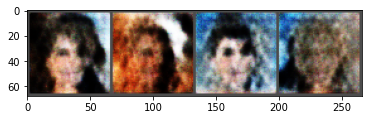

loss_d: 1.270, loss_g: 1.096


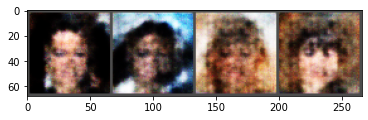


[3/3] - ptime: 3734.77, loss_d: 1.273, loss_g: 1.091


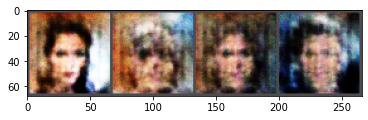

In [47]:
discriminator_lr = 0.00002
generator_lr = 0.0001
train_epochs = 3

generator = Generator(128)
discriminator = Discriminator(128)
generator.weight_init(mean=0.0, std=0.02)
discriminator.weight_init(mean=0.0, std=0.02)
generator = generator.cuda()
discriminator = discriminator.cuda()

# Binary Cross Entropy loss
BCE_loss = nn.BCELoss()

# Adam optimizer
G_optimizer = optim.Adam(generator.parameters(), lr=generator_lr, betas=(0.5, 0.999))
D_optimizer = optim.Adam(discriminator.parameters(), lr=discriminator_lr, betas=(0.5, 0.999))
# Train GAN
collect_x_gen = []
train(discriminator, generator, D_optimizer, G_optimizer, BCE_loss, celeba_train_loader, train_epochs)

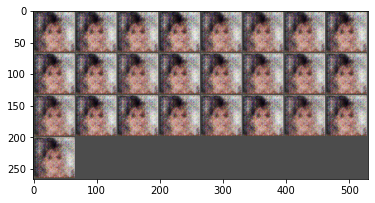

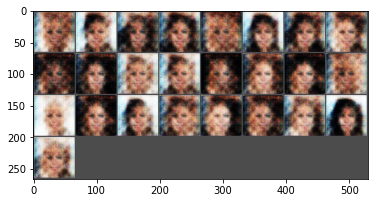

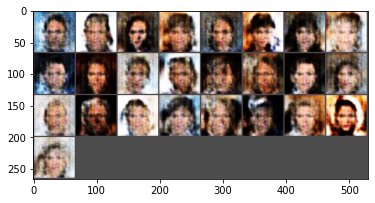

In [48]:
for x_gen in collect_x_gen:
    show_imgs(x_gen)

Now generate something with your own dataset! (Fashion, Mnist, Coco, Bedrooms, Pokemon)

In [10]:
![ ! -f dogs.zip ] && wget https://deep-learning-474.s3-us-west-1.amazonaws.com/dogs.zip
![ ! -d dogs ] && echo "unzipping dogs.zip" && unzip -q dogs.zip -d dogs

--2020-11-03 02:22:54--  https://deep-learning-474.s3-us-west-1.amazonaws.com/dogs.zip
Resolving deep-learning-474.s3-us-west-1.amazonaws.com (deep-learning-474.s3-us-west-1.amazonaws.com)... 52.219.117.25
Connecting to deep-learning-474.s3-us-west-1.amazonaws.com (deep-learning-474.s3-us-west-1.amazonaws.com)|52.219.117.25|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 775542127 (740M) [application/zip]
Saving to: ‘dogs.zip’

dogs.zip            100%[===================>] 739.61M  61.3MB/s    in 12s     

2020-11-03 02:23:06 (59.6 MB/s) - ‘dogs.zip’ saved [775542127/775542127]

unzipping dogs.zip


In [14]:
# Create a Dataloader for your own dataset
filepath = "dogs"
dog_batch_size = 64

dog_dataset = datasets.ImageFolder(root=filepath,
                           transform=transforms.Compose([
                               transforms.Resize(img_size),
                               transforms.CenterCrop(img_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
##### Create the dataloader #####
dog_train_loader = torch.utils.data.DataLoader(dog_dataset, batch_size=dog_batch_size, shuffle=True)

In [15]:
dog_discriminator_lr = 0.00002
dog_generator_lr = 0.0001
dog_train_epochs = 15

dog_generator = Generator(128)
dog_discriminator = Discriminator(128)
dog_generator.weight_init(mean=0.0, std=0.02)
dog_discriminator.weight_init(mean=0.0, std=0.02)
dog_generator = dog_generator.cuda()
dog_discriminator = dog_discriminator.cuda()

# Binary Cross Entropy loss
dog_loss = nn.BCELoss()

# Adam optimizer
dog_G_optimizer = optim.Adam(dog_generator.parameters(), lr=dog_generator_lr, betas=(0.5, 0.999))
dog_D_optimizer = optim.Adam(dog_discriminator.parameters(), lr=dog_discriminator_lr, betas=(0.5, 0.999))
# Train GAN
collect_x_gen = []

loss_d: 1.696, loss_g: 1.715


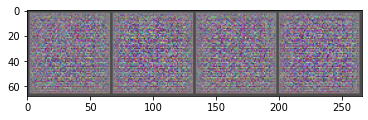

loss_d: 9.948, loss_g: 0.455


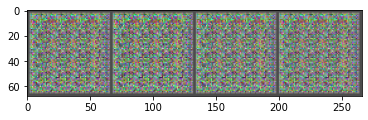

loss_d: 9.747, loss_g: 1.381


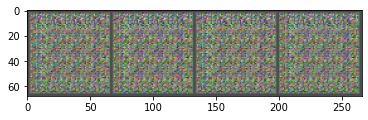

loss_d: 8.471, loss_g: 2.398


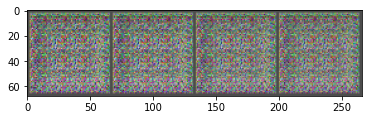


[1/15] - ptime: 736.44, loss_d: 8.319, loss_g: 2.511


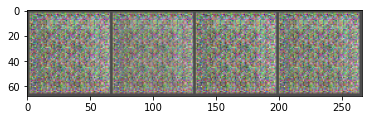

loss_d: 5.062, loss_g: 4.063


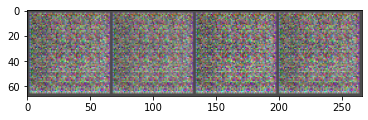

loss_d: 4.010, loss_g: 3.877


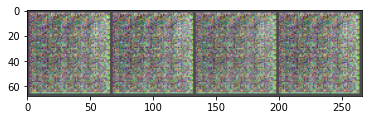

loss_d: 3.213, loss_g: 3.722


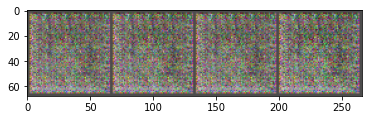


[2/15] - ptime: 761.05, loss_d: 3.001, loss_g: 3.634


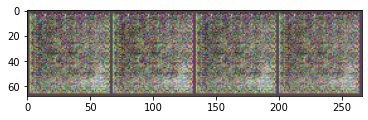

loss_d: 1.958, loss_g: 2.974


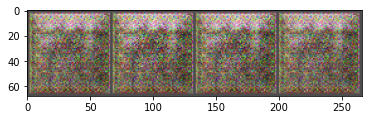

loss_d: 1.732, loss_g: 2.885


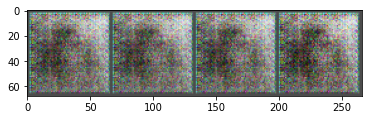

loss_d: 1.530, loss_g: 2.775


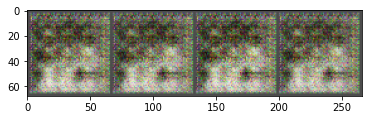


[3/15] - ptime: 759.17, loss_d: 1.517, loss_g: 2.720


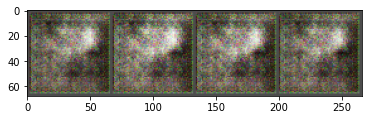

loss_d: 2.808, loss_g: 1.544


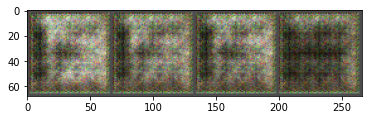

loss_d: 2.258, loss_g: 1.006


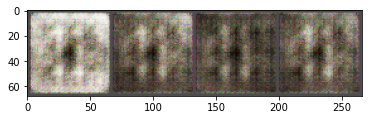

loss_d: 1.919, loss_g: 1.008


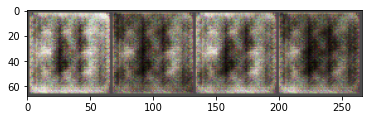


[4/15] - ptime: 759.15, loss_d: 1.814, loss_g: 1.012


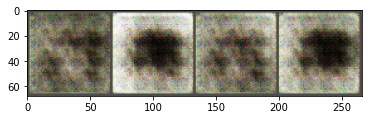

loss_d: 1.620, loss_g: 0.839


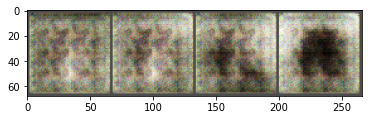

loss_d: 1.560, loss_g: 0.808


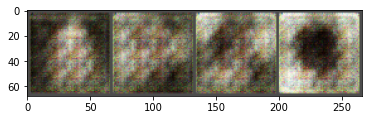

loss_d: 1.484, loss_g: 0.827


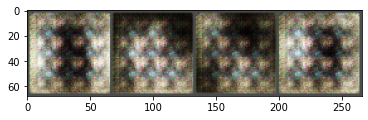

loss_d: 1.429, loss_g: 0.839


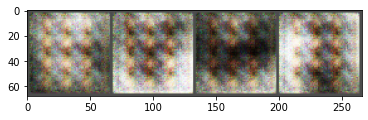


[5/15] - ptime: 761.70, loss_d: 1.425, loss_g: 0.840


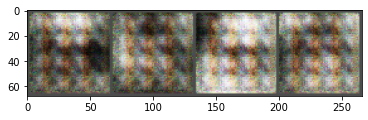

loss_d: 1.278, loss_g: 0.854


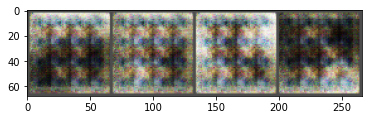

loss_d: 1.279, loss_g: 0.881


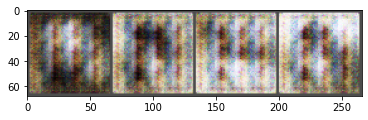

loss_d: 1.324, loss_g: 0.878


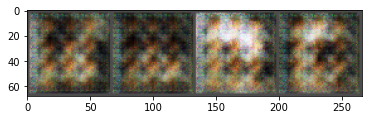


[6/15] - ptime: 758.50, loss_d: 1.331, loss_g: 0.873


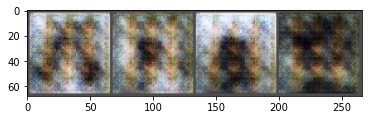

loss_d: 1.406, loss_g: 0.805


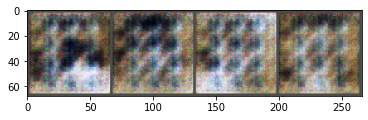

loss_d: 1.491, loss_g: 0.833


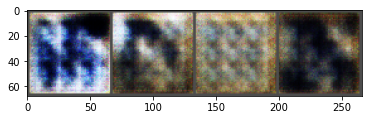

loss_d: 1.499, loss_g: 0.828


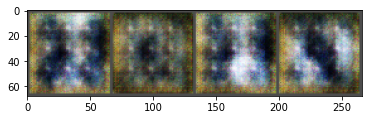


[7/15] - ptime: 756.92, loss_d: 1.485, loss_g: 0.828


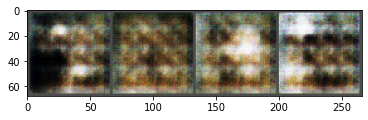

loss_d: 1.504, loss_g: 0.805


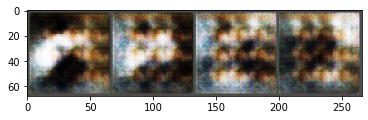

loss_d: 1.516, loss_g: 0.790


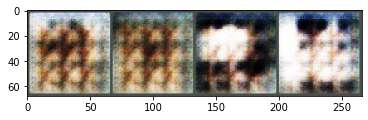

loss_d: 1.512, loss_g: 0.785


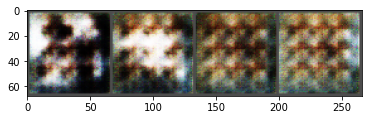


[8/15] - ptime: 763.78, loss_d: 1.510, loss_g: 0.787


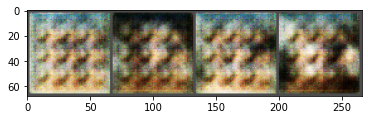

loss_d: 1.548, loss_g: 0.791


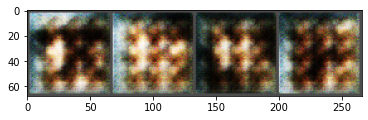

loss_d: 1.489, loss_g: 0.777


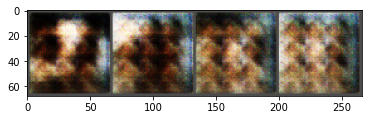

loss_d: 1.483, loss_g: 0.785


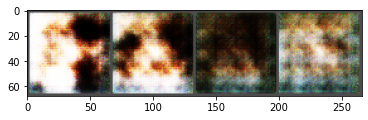


[9/15] - ptime: 760.28, loss_d: 1.472, loss_g: 0.789


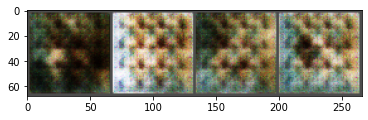

loss_d: 1.433, loss_g: 0.758


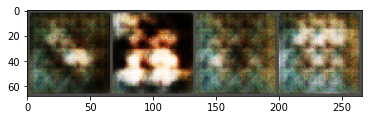

loss_d: 1.400, loss_g: 0.812


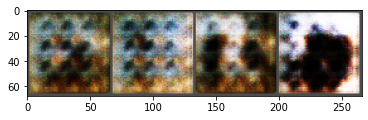

loss_d: 1.409, loss_g: 0.819


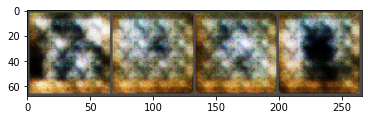

loss_d: 1.416, loss_g: 0.817


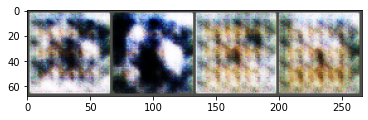


[10/15] - ptime: 758.28, loss_d: 1.417, loss_g: 0.816


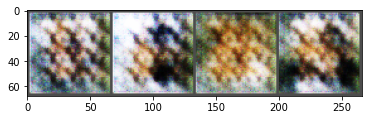

loss_d: 1.401, loss_g: 0.811


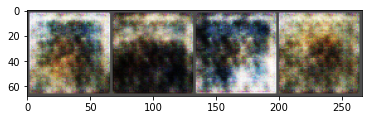

loss_d: 1.417, loss_g: 0.794


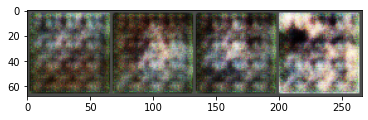

loss_d: 1.433, loss_g: 0.785


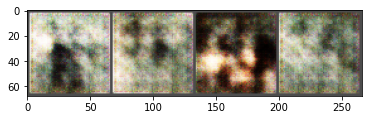


[11/15] - ptime: 761.88, loss_d: 1.433, loss_g: 0.784


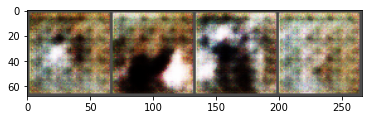

loss_d: 1.474, loss_g: 0.773


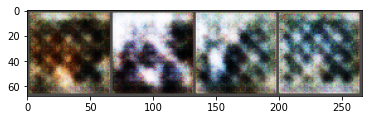

loss_d: 1.455, loss_g: 0.783


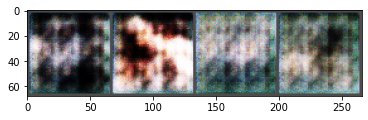

loss_d: 1.437, loss_g: 0.791


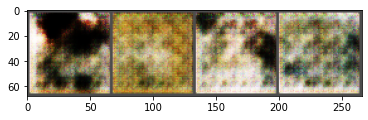


[12/15] - ptime: 758.17, loss_d: 1.441, loss_g: 0.789


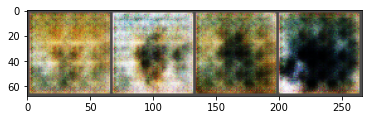

loss_d: 1.454, loss_g: 0.760


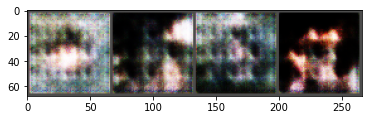

loss_d: 1.432, loss_g: 0.792


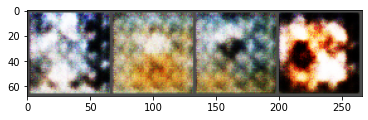

loss_d: 1.431, loss_g: 0.788


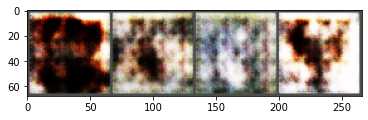


[13/15] - ptime: 761.76, loss_d: 1.431, loss_g: 0.783


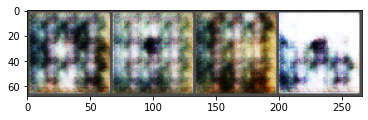

loss_d: 1.423, loss_g: 0.779


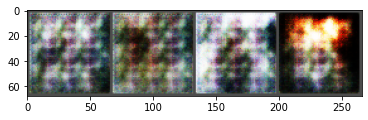

loss_d: 1.425, loss_g: 0.790


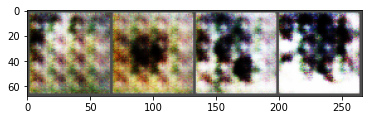

loss_d: 1.427, loss_g: 0.778


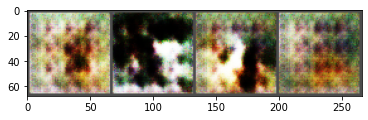

loss_d: 1.425, loss_g: 0.776


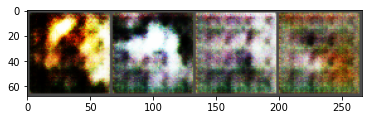


[14/15] - ptime: 759.06, loss_d: 1.425, loss_g: 0.776


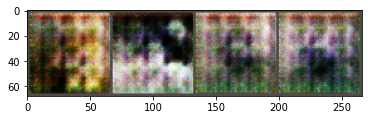

loss_d: 1.434, loss_g: 0.777


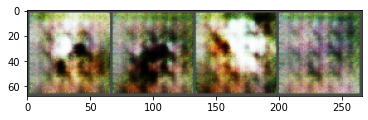

loss_d: 1.425, loss_g: 0.774


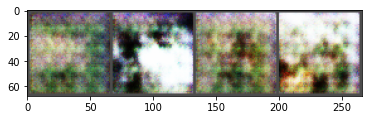

loss_d: 1.424, loss_g: 0.773


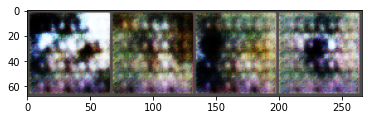


[15/15] - ptime: 758.12, loss_d: 1.425, loss_g: 0.772


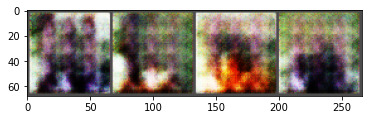

In [16]:
train(dog_discriminator, dog_generator, dog_D_optimizer, dog_G_optimizer, dog_loss, dog_train_loader, dog_train_epochs)

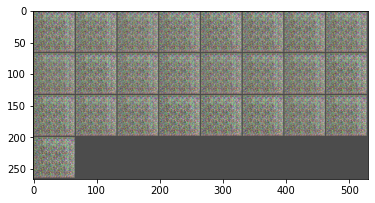

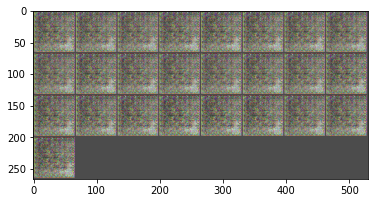

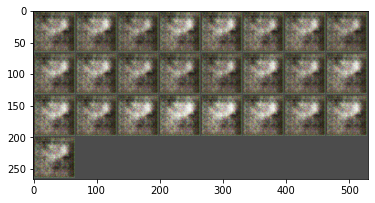

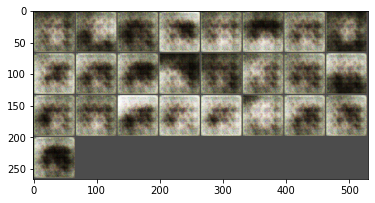

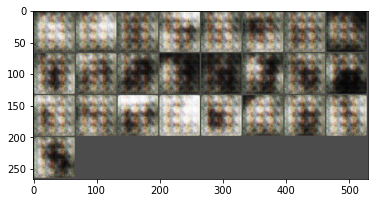

...

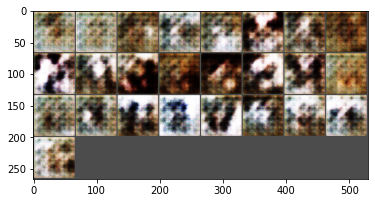

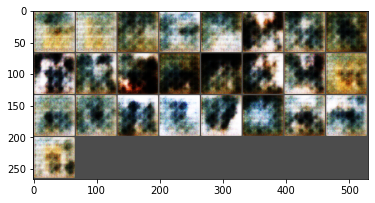

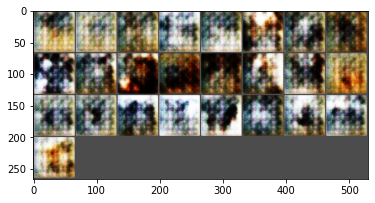

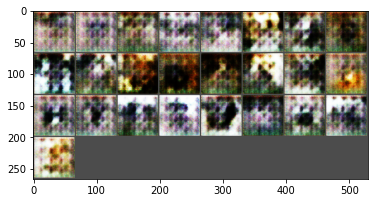

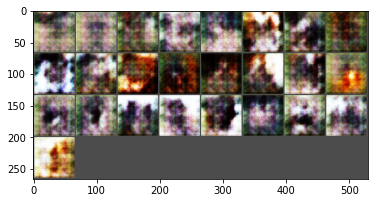

In [17]:
for x_gen in collect_x_gen:
    show_imgs(x_gen)

# A demo of a state of the art GAN and "painting" with them in your browser:

https://gandissect.csail.mit.edu

By our colleagues at the MIT-IBM Watson AI Lab.


# Where to go from here
* Use a more exciting datasets - check out [the pytorch torchvision.datasets](https://pytorch.org/docs/stable/torchvision/datasets.html) to get started quickly.
* The [original GAN paper](https://papers.nips.cc/paper/5423-generative-adversarial-nets)
* The [DCGAN paper](https://arxiv.org/abs/1511.06434) which made it all work much better for images. Start from: pytorch DCGAN [example](https://github.com/pytorch/examples/blob/master/dcgan/main.py) and [tutorial](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html)
* Newer generations of loss functions measure different distances between distributions $p_{data}$ and $p_G$. For example [WGAN](https://github.com/martinarjovsky/WassersteinGAN), [WGAN-GP](https://arxiv.org/abs/1704.00028), [Fisher GAN](https://arxiv.org/abs/1705.09675), [Sobolev GAN](https://arxiv.org/abs/1711.04894), many more. They often have better stability properties wrt the original GAN loss.

# References for this tutorial
* pytorch DCGAN [example](https://github.com/pytorch/examples/blob/master/dcgan/main.py) and [tutorial](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html) by Nathan Inkawhich
* [Medium blog post](https://medium.com/ai-society/gans-from-scratch-1-a-deep-introduction-with-code-in-pytorch-and-tensorflow-cb03cdcdba0f) by Diego Gomez Mosquera
* [Material made for ITDS course at CUNY](https://github.com/grantmlong/itds2019/blob/master/lecture-6/DL_lab_solutions.ipynb) by Tom Sercu (that's me!)
* [Blog post](https://towardsdatascience.com/graduating-in-gans-going-from-understanding-generative-adversarial-networks-to-running-your-own-39804c283399) by Cecelia Shao
* [GAN overview image](https://www.slideshare.net/xavigiro/deep-learning-for-computer-vision-generative-models-and-adversarial-training-upc-2016) from Xavier Giro